# **Computer Vision Examen**

#### Author: **MBOCK MBOCK GEORGES CHRISTIAN**


## **Table of contents**

1. [Introduction](#intro)
2. [Objectif](#objectif)
3. [Méthodologie](#metho)
   
   3-a [Verification du matériel](#GPU)

   3-b [Clonnage du depot du yolov5](#yolov5)

   3-c [Chargement des données grâce à l'API](#api)

   3-d [Lancement du Modèle](#model)
4. [Evaluation statistique du Modèle et Visualisation](#metrics)

5. [Inference des images tests du dataset](#infer)

   5-a [Inférence des images testes](#test)

   5-b [Résultats de l'inférence des images testes](#rtest)

6. [Inférence des images du dossier Project_Face_Mark_test ](#inf)

   6-a [Inférence Project_Face_Mark_test](#infp)

   6-b [Résultats de l'inférence Project_Face_Mark_test](#rinfp)

7. [Inférence de la vidéo vid.mp4 du dossier Project_Face_Mark_test](#infv)
  
   7-a [Inférence Project_Face_Mark_test](#infpv)

   7-b [Résultats de l'inférence Project_Face_Mark_test](#rinfpv)

8. [Conclusion](#conclusion)

### **Introduction**
<a name="intro"></a>


Dans le contexte de la pandémie de COVID-19, le port du masque est devenu une mesure essentielle pour limiter la propagation du virus. Les autorités de santé publique et les gouvernements du monde entier ont recommandé, voire imposé, l'utilisation des masques dans les lieux publics pour protéger les individus et réduire le risque d'infection. Cependant, la surveillance manuelle du port du masque dans des environnements publics tels que les écoles, les hôpitaux, les transports en commun et les centres commerciaux est une tâche complexe et chronophage.

Pour automatiser cette tâche, les technologies d'intelligence artificielle (IA) et de vision par ordinateur offrent une solution prometteuse grâce à des modèles de détection de masques en temps réel. Ce projet vise à développer un système de détection automatique des masques faciaux en utilisant des techniques d'apprentissage profond. Le modèle sera capable de reconnaître si une personne porte un masque correctement, de manière incorrecte, ou n'en porte pas du tout, en se basant sur des images ou des flux vidéo en direct.

Description du Jeu de Données
Le jeu de données utilisé pour ce projet comprend des images d'individus avec et sans masque. Ces images sont collectées dans divers environnements, comme les espaces publics, les bureaux, et les transports en commun, et incluent une variété de personnes de différents âges, ethnies et sexes pour garantir la robustesse et l'équité du modèle.

### **Objectifs**
<a name="obj"></a>

Dans le cadre de cet examen, veuillez trouver les objectifs attendus sur ce [**lien**](https://docs.google.com/document/d/1Di5xMxndmaO7kB4onrqvJbpvht90jPkt/edit?usp=sharing&ouid=113765388985217123835&rtpof=true&sd=true)

### **3. Méthodologie**
<a name="metho"></a>

#### **3-a. Verification du matériel**
<a name="GPU"></a>

In [1]:
# verification du GPU
!nvidia-smi

Tue Sep  3 13:44:40 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   47C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

#### **3-b. Clonnage du depot du yolov5**
<a name="yolov5"></a>

In [2]:
#clone YOLOv5 and
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

Cloning into 'yolov5'...
remote: Enumerating objects: 16941, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 16941 (delta 70), reused 92 (delta 48), pack-reused 16805 (from 1)
Receiving objects: 100% (16941/16941), 15.70 MiB | 17.15 MiB/s, done.
Resolving deltas: 100% (11603/11603), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.1/872.1 kB 57.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.9 MB/s eta 0:

#### **3-c. Chargement de des données grâce à API**
<a name="api"></a>

In [3]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="HgoT5WoN2NamAgKmxzYR")
project = rf.workspace("matriculation").project("detect_mask-0393r")
version = project.version(2)
dataset = version.download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Detect_mask-2 in yolov5pytorch:: 100%|██████████| 1082/1082 [00:00<00:00, 5205.10it/s]


#### **3-d. Lancement du Modèle**
<a name="model"></a>

In [4]:
# Model launch
!python train.py --img 640 --batch 16 --epochs 300 --data {dataset.location}/data.yaml --weights yolov5s.pt --cache

Streaming output truncated to the last 5000 lines.
    144/299      4.37G    0.01388   0.004922          0         27        640:  27% 8/30 [00:02<00:05,  3.67it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    144/299      4.37G    0.01376    0.00499          0         34        640:  30% 9/30 [00:02<00:05,  3.99it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    144/299      4.37G    0.01379   0.004766          0         14        640:  33% 10/30 [00:02<00:05,  3.85it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
    144/299      4.37G    0.01367   0.0

### **4. Evaluation statistique du Modèle et Visualisation**
<a name="metrics"></a>

In [5]:
# Start tensorboard
# Launch after you have started training
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir /content/yolov5/runs/train/exp

<IPython.core.display.Javascript object>

### **5. Inference des images tests du dataset**
<a name="infer"></a>

#### **5-a. Inference des données testes**
<a name="test"></a>

In [6]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt  --conf 0.5 --source '/content/yolov5/Detect_mask-2/test/images/*.jpg'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/yolov5/Detect_mask-2/test/images/*.jpg, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/22 /content/yolov5/Detect_mask-2/test/images/b_mask102_jpeg.rf.997ce2811b77c8b76f9873a0c334453b.jpg: 640x640 (no detections), 11.4ms
WARNING ⚠️ NMS time limit 0.550s exceeded
image 2/22 /content/yolov5/Detect_mask-2/test/images/b_mask107_jpeg.rf.324a68c805ab15db0

#### **5-b. Résultats de l'inférence des images testes**
<a name ="rtest"></a>

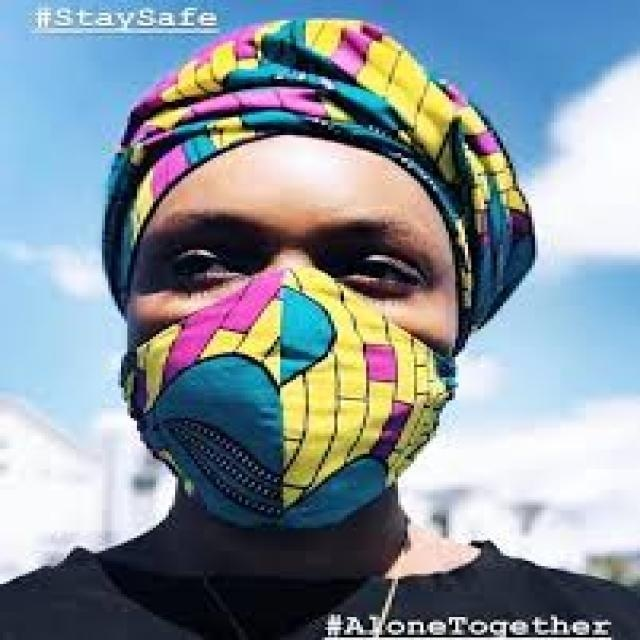

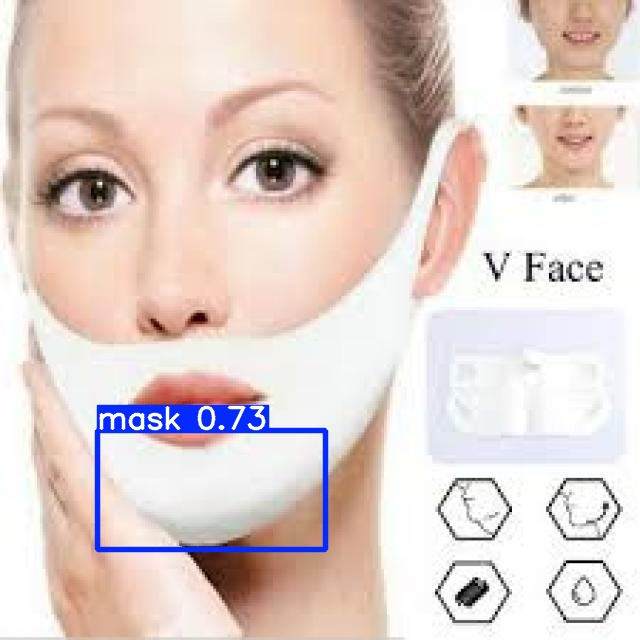

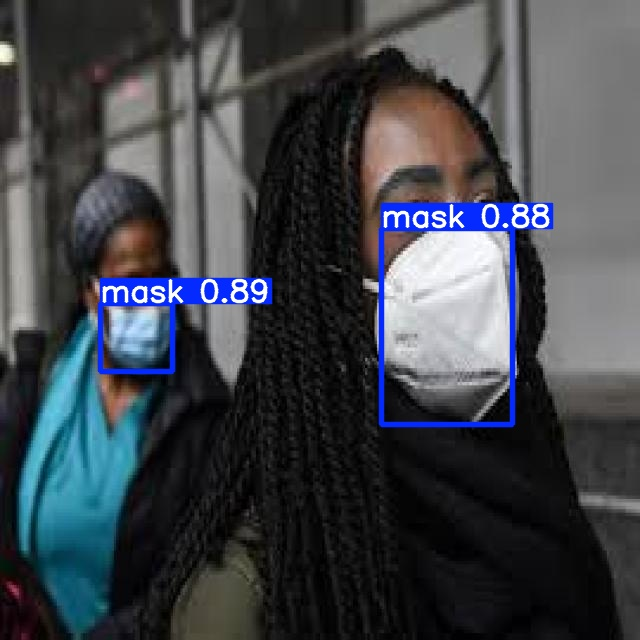

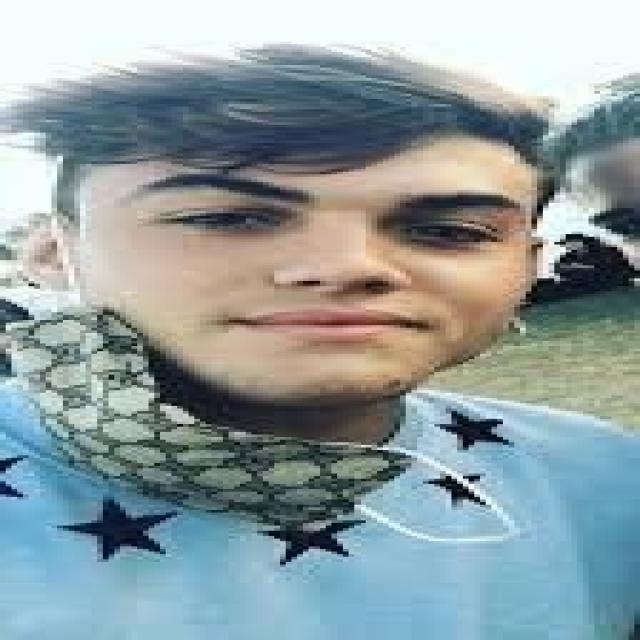

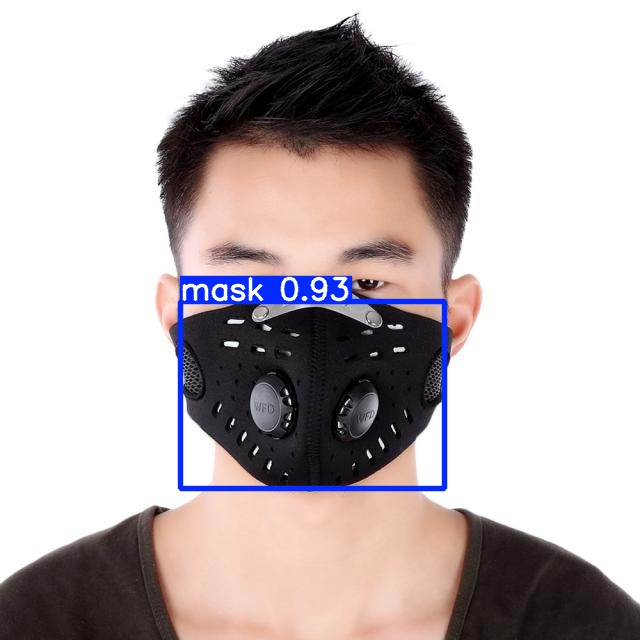

...

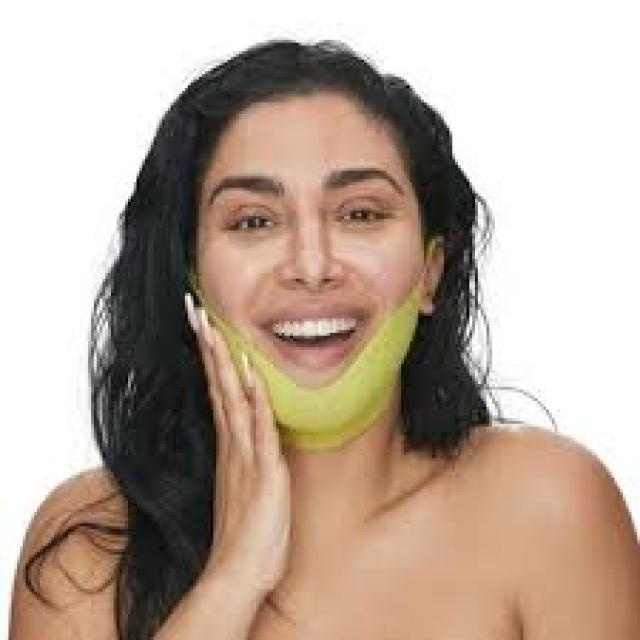

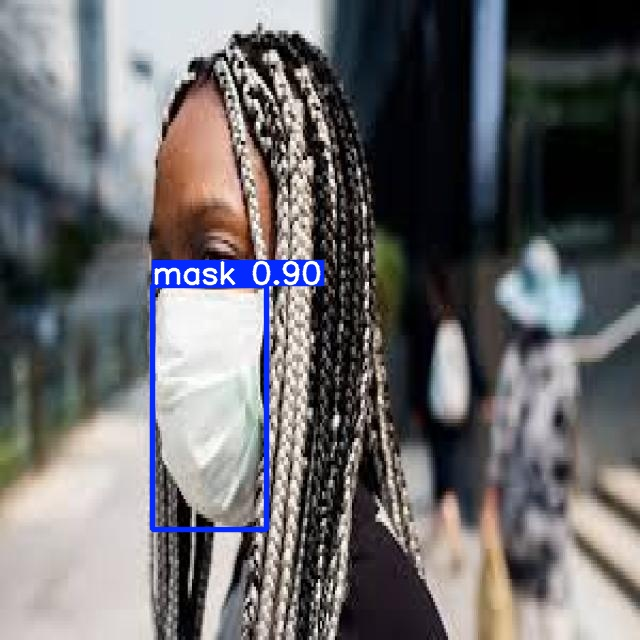

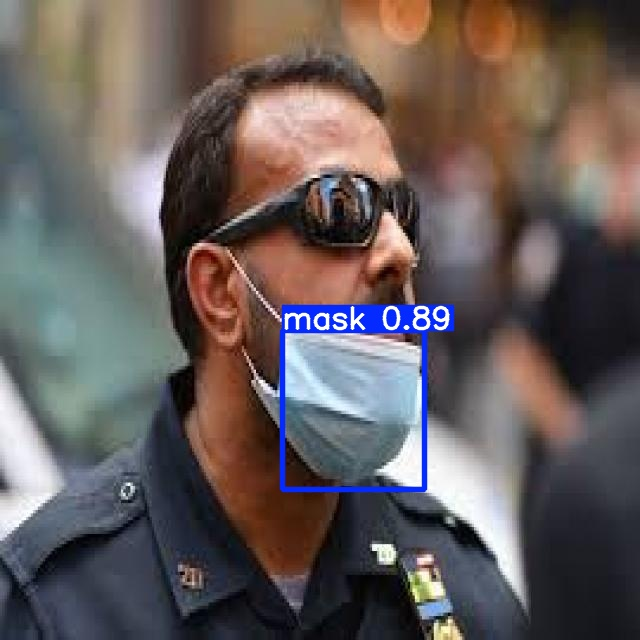

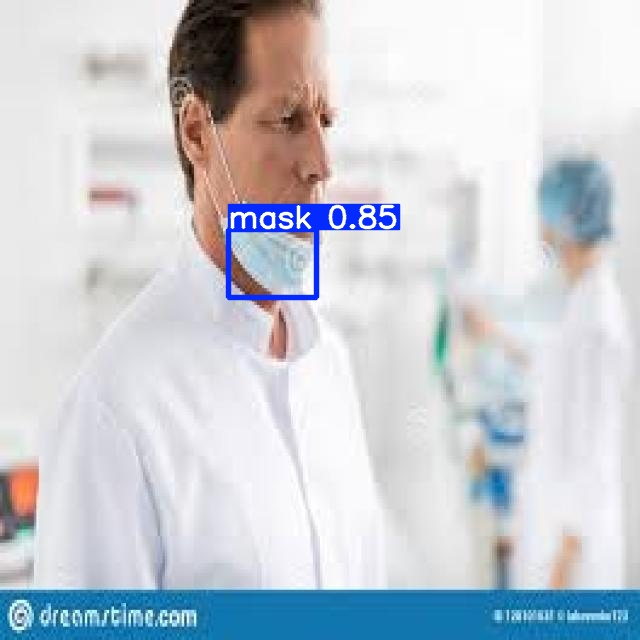

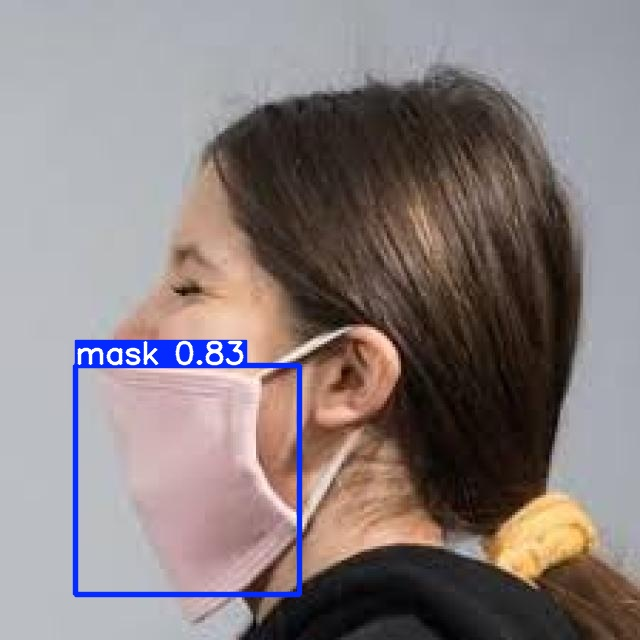

In [7]:
#display inference on ALL test images

import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")

### **6. Inférence des images du dossier Project_Face_Mark_test**
<a name="inf"> </a>

#### **6-a. Inférence Project_Face_Mark_test**
<a name="infp"></a>

In [11]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt  --conf 0.5 --source '/content/drive/MyDrive/Projet_Face_Mask_test/*'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/Projet_Face_Mask_test/*, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.5, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
image 1/6 /content/drive/MyDrive/Projet_Face_Mask_test/burka8.jpg: 640x384 1 mask, 26.4ms
image 2/6 /content/drive/MyDrive/Projet_Face_Mask_test/burka9.jpg: 448x640 (no detections), 28.0ms
image 3/6 /content/drive/MyDrive/Projet_Face_Mask_test/img1.jpeg: 448x640 4 masks, 

#### **6-b. Résultats de l'inférence Project_Face_Mark_test**
<a name="rinfp"></a>

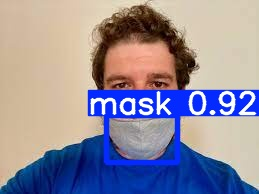

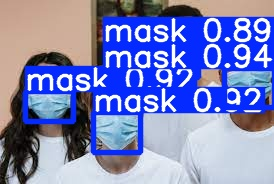

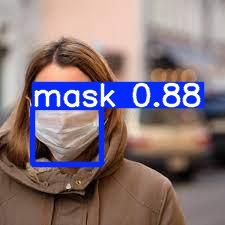

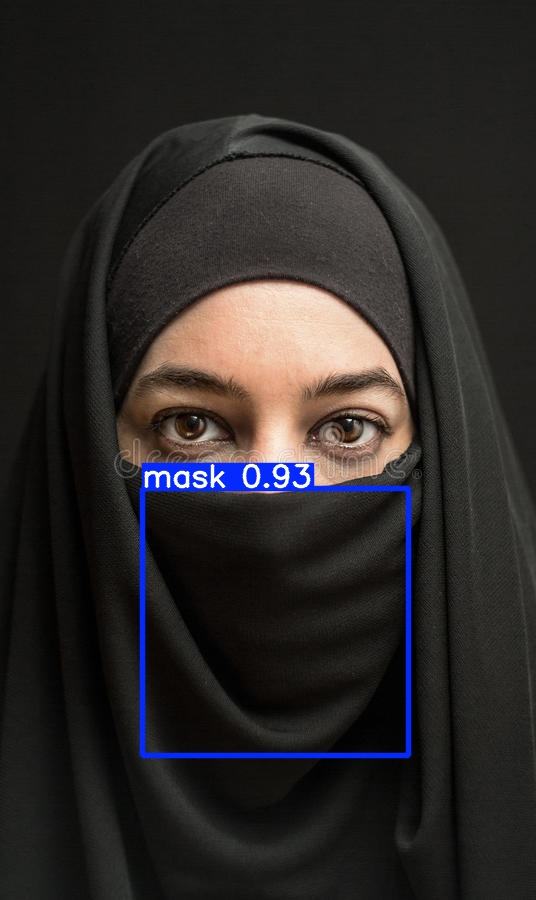

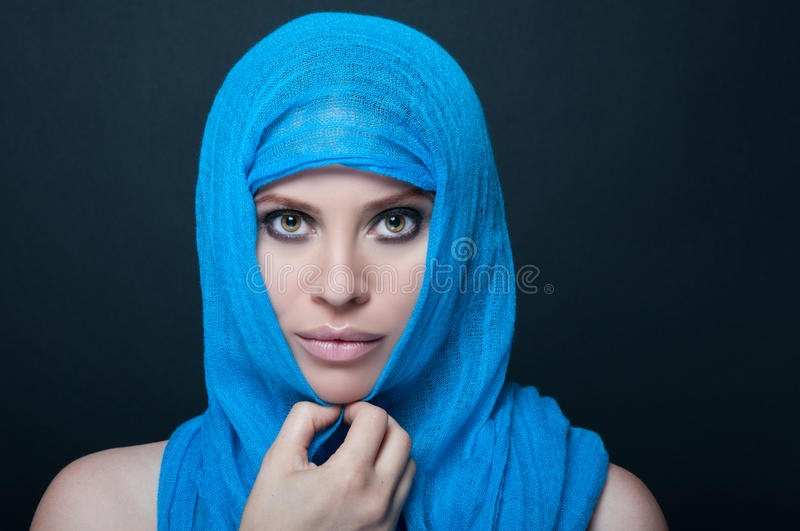

In [23]:
for imageName in glob.glob('/content/yolov5/runs/detect/exp4/*.jpeg') + glob.glob('/content/yolov5/runs/detect/exp4/*.jpg'):
    display(Image(filename=imageName))
    print("\n")

### **7. Inférence de la vidéo vid.mp4 du dossier Project_Face_Mark_test**
<a name="infv"> </a>

#### **7-a. Inférence sur la vidéo vid.mp4**
<a name="infpv"> </a>

In [29]:
!python detect.py --weights /content/yolov5/runs/train/exp/weights/best.pt  --conf 0.82 --source '/content/drive/MyDrive/Projet_Face_Mask_test/vid.mp4'

detect: weights=['/content/yolov5/runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/Projet_Face_Mask_test/vid.mp4, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.82, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.12 torch-2.4.0+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
video 1/1 (1/213) /content/drive/MyDrive/Projet_Face_Mask_test/vid.mp4: 384x640 4 masks, 31.8ms
video 1/1 (2/213) /content/drive/MyDrive/Projet_Face_Mask_test/vid.mp4: 384x640 4 masks, 7.6ms
video 1/1 (3/213) /content/drive/MyDrive/Projet_Face_Mask_test/vid.mp4: 38

#### **7-b. Résultats de l'inférence Project_Face_Mark_test**
<a name="rinfpv"></a>

 [**Resultat de la vidéo**](https://drive.google.com/file/d/16AQwgizBO_8Nubf8yTWui3CHjVw9zuEH/view?usp=drive_link)

### **Conclusion**
<a name="cl"></a>
Ce projet représente une première étape vers l'automatisation de la détection du port du masque à l'aide de techniques d'intelligence artificielle. Bien que nos efforts initiaux aient permis de développer un modèle capable de distinguer les individus portant un masque de ceux qui n'en portent pas, nous sommes conscients qu'il reste encore beaucoup à faire pour améliorer la précision et la robustesse de notre système, en particulier dans des conditions réelles variées et imprévisibles.

Nous sommes au début de notre démarche, et nous continuerons à affiner notre approche en travaillant sur l'enrichissement du jeu de données, l'optimisation de l'algorithme de détection, et l'intégration de nouvelles techniques d'apprentissage profond. Grâce à un processus itératif d'amélioration continue, nous espérons développer une solution de détection de masques encore plus efficace et adaptable à différents environnements. 